# DS Finance Dojo

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%load_ext watermark
%watermark -v -m -p numpy,pandas,matplotlib,seaborn,cufflinks,plotly -g

import re
from tqdm import tqdm
import yaml
import pandas as pd
import numpy as np
import watermark
from pprint import pprint as pp
import matplotlib.pyplot as plt
import seaborn as sns

import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

CPython 3.7.3
IPython 7.8.0

numpy 1.17.4
pandas 0.25.1
matplotlib 3.1.1
seaborn 0.9.0
cufflinks 0.13.0
plotly 2.7.0

compiler   : Clang 4.0.1 (tags/RELEASE_401/final)
system     : Darwin
release    : 19.0.0
machine    : x86_64
processor  : i386
CPU cores  : 16
interpreter: 64bit
Git hash   : 529455e71c3fbe1904341a957cbe9f1267d1c067


In [2]:
import pandas_profiling
from sklearn import preprocessing
from scipy.spatial.distance import cosine
from scipy.stats import pearsonr

### Constants

Modify these values to update the config file, the query or the output file.

In [3]:
BONDS_FILE = "./data/UN00 Rules V1.csv"

### Load data

In [4]:
df = pd.read_csv(BONDS_FILE)

In [5]:
df.head()

,Cusip,ISIN,Description,Ticker,Coupon,Maturity,Composite Rating,Currency,Country,Sector Level 1,...,1203,1204,1205,1206,1207,1208,1209,1210,1211,1212
0,'AL319313',XS1529687870,AA Bond Co Limited,AABOND,2.875,1/31/2022,BBB3,GBP,GB,Securitized/Collateralized,...,0,0,0,0,0,0,0,0,0,0
1,'AO236287',XS1645315620,AA Bond Co Limited,AABOND,2.750,7/31/2023,BBB3,GBP,GB,Securitized/Collateralized,...,0,0,0,0,0,0,0,0,0,0
2,'AT538379',XS1856940462,AA Bond Co Limited,AABOND,4.875,7/31/2024,BBB3,GBP,GB,Securitized/Collateralized,...,0,0,0,0,0,0,0,0,0,0
3,'EJ733791',XS0949169923,AA Bond Co Limited,AABOND,6.269,7/31/2025,BBB3,GBP,GB,Securitized/Collateralized,...,0,0,0,0,0,0,0,0,0,0
4,'EJ944681',XS0996575378,AA Bond Co Limited,AABOND,4.249,7/31/2020,BBB3,GBP,GB,Securitized/Collateralized,...,0,0,0,0,0,0,0,0,0,0


In [6]:
df.describe()

,Coupon,Face Value,Price,Accrued Interest,% Weight,Cash,Duration To Worst,Yield to Worst,Effective Duration,Effective Yield,...,1203,1204,1205,1206,1207,1208,1209,1210,1211,1212
count,1210.000000,1148.000000,1211.000000,1148.000000,1148.000000,1148.000000,1148.000000,1148.000000,1211.000000,1148.000000,...,1211.000000,1211.000000,1211.000000,1211.000000,1211.000000,1211.000000,1211.000000,1211.000000,1211.000000,1211.000000
mean,4.241144,441.275268,113.212597,1.746092,0.087108,0.072030,7.397274,2.445651,7.855656,2.437878,...,0.002477,0.000826,0.001652,0.000826,0.000826,0.000826,0.000826,0.002477,0.002477,0.000826
std,2.059010,327.885744,15.724372,1.522828,0.067863,0.566929,5.146055,0.892198,5.508675,0.888437,...,0.049731,0.028736,0.040622,0.028736,0.028736,0.028736,0.028736,0.049731,0.049731,0.028736
min,0.000000,100.000000,69.617410,0.000000,0.016060,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.625000,250.000000,100.285650,0.550428,0.048407,0.000000,3.491500,1.671000,3.574000,1.668000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.500000,350.000000,109.620100,1.239726,0.067590,0.000000,6.126500,2.519000,6.450000,2.504000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,5.750000,500.000000,122.584950,2.649230,0.102763,0.000000,10.153500,3.093000,10.955000,3.093000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,12.000000,4800.000000,188.296600,7.247917,0.828830,9.500000,34.792000,6.506000,35.210000,6.506000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [7]:
# df.profile_report()

In [8]:
df.Ticker.nunique()

427

In [9]:
df.Ticker.unique()[:20]

array(['AABOND', 'AAPL', 'AARB', 'ABIBB', 'ABNANV', 'ABPFIN', 'ACAFP',
       'ADMLN', 'ADOHOU', 'AEGON', 'AFCPZ', 'AFDB', 'AFFNTY', 'AFSCM',
       'AGRFIN', 'AHFILN', 'AIG', 'AIOAU', 'AKFAST', 'ALTA'], dtype=object)

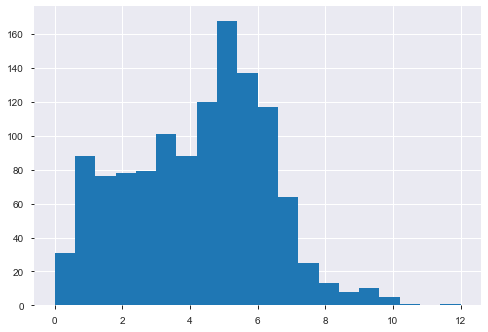

In [41]:
df.Coupon.hist(bins=20);

(0, 10)

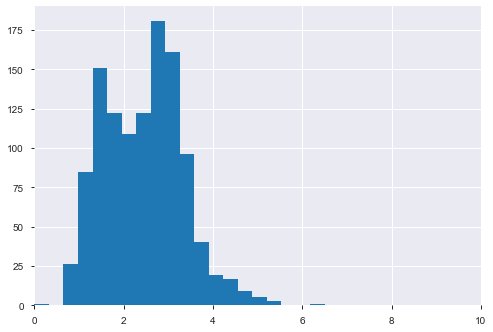

In [54]:
df['Yield to Worst'].hist(bins=20).set_xlim(0,10)

In [10]:
# Select numeric columns
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df_num = df.select_dtypes(include=numerics)

In [11]:
# Ignore for the moment one-hot encoding columns
df_sub = df_num.iloc[:, :27]

In [12]:
# Detect null values
df_sub.isna().any()

Coupon                                 True
Face Value                             True
Price                                 False
Accrued Interest                       True
% Weight                               True
Cash                                   True
Duration To Worst                      True
Yield to Worst                         True
Effective Duration                    False
Effective Yield                        True
OAS vs Govt                            True
Prior Month-End Price                  True
Prior Month-End Accrued Interest       True
Prior Month-End % Weight               True
Prior Month-End Duration To Worst      True
Prior Month-End Yield To Worst         True
Prior Month-End Effective Duration     True
Prior Month-End Effective Yield        True
Prior Month-End OAS vs Govt            True
TRR % MTD LOC                          True
Excess Rtn % MTD                       True
Asset Swap Spread                      True
Prior Month-End Asset Swap Sprea

In [13]:
# Fill null values with average
df_sub = df_sub.fillna(df_sub.mean())

In [14]:
# Normalize data
x = df_sub.values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
df_scaled = pd.DataFrame(x_scaled, columns=df_sub.columns)

In [15]:
df_scaled.head()

,Coupon,Face Value,Price,Accrued Interest,% Weight,Cash,Duration To Worst,Yield to Worst,Effective Duration,Effective Yield,...,Prior Month-End Effective Yield,Prior Month-End OAS vs Govt,TRR % MTD LOC,Excess Rtn % MTD,Asset Swap Spread,Prior Month-End Asset Swap Spread,OAS vs Swap,Prior Month-End OAS vs Swap,Illiquidity Premium,Unnamed: 39
0,0.239583,0.127660,0.233881,0.012654,0.123676,0.0,0.092924,0.644789,0.092985,0.644789,...,0.614413,0.672700,0.339283,0.362551,0.538843,0.620573,0.573872,0.652313,0.321266,0.000000
1,0.229167,0.031915,0.202276,0.010310,0.029492,0.0,0.131352,0.650323,0.130105,0.642638,...,0.611510,0.653092,0.343347,0.363086,0.591736,0.590219,0.634526,0.633174,0.321266,0.000826
2,0.406250,0.095745,0.264429,0.044290,0.097395,0.0,0.147304,0.718260,0.146095,0.718260,...,0.694160,0.716440,0.340873,0.357919,0.684298,0.684654,0.704510,0.704944,0.321266,0.001653
3,0.522417,0.085106,0.335017,0.023504,0.095390,0.0,0.163141,0.718875,0.156887,0.718875,...,0.697063,0.707391,0.355010,0.369499,0.866116,0.704890,0.846034,0.700159,0.321266,0.002479
4,0.354083,0.021277,0.284769,0.019678,0.023783,0.0,0.053662,0.529204,0.053706,0.529204,...,0.499658,0.592760,0.356954,0.386424,0.376860,0.551433,0.407465,0.570973,0.321266,0.003306


In [18]:
df_test = df_scaled.iloc[:10, :]

In [20]:
df_test.apply(lambda row: df_test.apply(lambda subrow: 1 - cosine(subrow, row), axis=1), axis=1)

,0,1,2,3,4,5,6,7,8,9
0,1.000000,0.994847,0.995321,0.984078,0.985162,0.862425,0.805414,0.851269,0.922267,0.921264
1,0.994847,1.000000,0.995955,0.988328,0.979649,0.857095,0.811967,0.846209,0.917599,0.921700
2,0.995321,0.995955,1.000000,0.995151,0.981333,0.860838,0.814099,0.837611,0.917468,0.920669
3,0.984078,0.988328,0.995151,1.000000,0.970028,0.858537,0.814062,0.839533,0.911075,0.912811
4,0.985162,0.979649,0.981333,0.970028,1.000000,0.877265,0.819313,0.885241,0.925866,0.918265
5,0.862425,0.857095,0.860838,0.858537,0.877265,1.000000,0.980209,0.928255,0.979965,0.982868
6,0.805414,0.811967,0.814099,0.814062,0.819313,0.980209,1.000000,0.864685,0.942050,0.962971
7,0.851269,0.846209,0.837611,0.839533,0.885241,0.928255,0.864685,1.000000,0.948804,0.911123
8,0.922267,0.917599,0.917468,0.911075,0.925866,0.979965,0.942050,0.948804,1.000000,0.991193
9,0.921264,0.921700,0.920669,0.912811,0.918265,0.982868,0.962971,0.911123,0.991193,1.000000


In [21]:
# Cosine similarity
df_similarity = df_scaled.apply(lambda row: df_scaled.apply(lambda subrow: 1 - cosine(subrow, row), axis=1), axis=1)
# Pearson similarity
df_pearson = df_scaled.apply(lambda row: df_scaled.apply(lambda subrow: pearsonr(subrow, row)[0], axis=1), axis=1)

In [22]:
# Get top 10 similar entries by similarity
topN = 10

bonds_by_cosine = []
bonds_by_pearson = []
for k in range(10):
    bonds_by_cosine.append([x for x in df_similarity.iloc[k,:].sort_values(ascending=False)[:topN].index if x != k])
    bonds_by_pearson.append([x for x in df_pearson.iloc[k,:].sort_values(ascending=False)[:topN].index if x != k])

In [31]:
# Ticker and Cusip

for k in range(10):
    print(f"{df.Ticker[k]}\t{df.Cusip[k]}\nCosine Similarity:\n{','.join(df.Cusip[bonds_by_cosine[k]])}")
    print(f"{df.Ticker[k]}\t{df.Cusip[k]}\nPearson Similarity:\n{','.join(df.Cusip[bonds_by_pearson[k]])}\n")

AABOND	'AL319313'
Cosine Similarity:
'AT538379','AO236287','EJ944681','EJ516173','EJ733791','EK024610','EK943555','AO021875','EK378115'
AABOND	'AL319313'
Pearson Similarity:
'AO236287','AT538379','EJ944681','EJ516173','QZ161770','EJ733791','EK024610','EK943555','AO021875'

AABOND	'AO236287'
Cosine Similarity:
'AT538379','AL319313','EJ733791','EK943555','AO021875','EK024610','QZ448787','EK378115','AM754842'
AABOND	'AO236287'
Pearson Similarity:
'AT538379','AL319313','EK943555','AO021875','QZ448787','EJ733791','AM754842','EK024610','AL500687'

AABOND	'AT538379'
Cosine Similarity:
'AO236287','AL319313','EJ733791','EK943555','EK024610','EJ516173','EF477773','EK378115','QZ448787'
AABOND	'AT538379'
Pearson Similarity:
'AO236287','AL319313','EJ733791','EK943555','EK024610','EJ516173','QZ448787','EF477773','EK824997'

AABOND	'EJ733791'
Cosine Similarity:
'AT538379','EF477773','EK378115','AO236287','EF527982','EK943555','EK024610','AL319313','EJ516173'
AABOND	'EJ733791'
Pearson Similarity:
'AT5

In [40]:
df.iloc[[0, *bonds_by_cosine[0]], :38]

,Cusip,ISIN,Description,Ticker,Coupon,Maturity,Composite Rating,Currency,Country,Sector Level 1,...,Prior Month-End Yield To Worst,Prior Month-End Effective Duration,Prior Month-End Effective Yield,Prior Month-End OAS vs Govt,TRR % MTD LOC,Excess Rtn % MTD,Asset Swap Spread,Prior Month-End Asset Swap Spread,OAS vs Swap,Prior Month-End OAS vs Swap
0,'AL319313',XS1529687870,AA Bond Co Limited,AABOND,2.875,1/31/2022,BBB3,GBP,GB,Securitized/Collateralized,...,4.221,3.266,4.221,331.0,0.184,0.068,235.0,285.0,243.0,294.0
2,'AT538379',XS1856940462,AA Bond Co Limited,AABOND,4.875,7/31/2024,BBB3,GBP,GB,Securitized/Collateralized,...,4.688,5.168,4.688,360.0,0.193,0.042,323.0,323.0,327.0,327.0
1,'AO236287',XS1645315620,AA Bond Co Limited,AABOND,2.750,7/31/2023,BBB3,GBP,GB,Securitized/Collateralized,...,4.254,4.604,4.204,318.0,0.207,0.071,267.0,267.0,282.0,282.0
4,'EJ944681',XS0996575378,AA Bond Co Limited,AABOND,4.249,7/31/2020,BBB3,GBP,GB,Securitized/Collateralized,...,3.549,1.892,3.549,278.0,0.284,0.202,137.0,244.0,136.0,243.0
319,'EJ516173',FR0011401728,Electricite de France SA,EDF,6.000,1/29/2026,BBB3,GBP,FR,Corporate,...,5.423,5.836,5.394,376.0,0.008,-0.192,381.0,380.0,373.0,371.0
3,'EJ733791',XS0949169923,AA Bond Co Limited,AABOND,6.269,7/31/2025,BBB3,GBP,GB,Securitized/Collateralized,...,4.705,5.728,4.705,354.0,0.273,0.107,433.0,335.0,418.0,324.0
320,'EK024610',FR0011700293,Electricite de France SA,EDF,5.875,1/22/2029,BBB3,GBP,FR,Corporate,...,5.131,7.065,5.152,350.0,-0.056,-0.274,330.0,329.0,354.0,352.0
81,'EK943555',XS1242413166,Aviva Plc,AVLN,5.125,06/04/2030,BBB1,GBP,GB,Corporate,...,4.743,8.882,4.299,294.0,0.426,0.180,318.0,319.0,286.0,287.0
266,'AO021875',XS1637124741,Cybg Plc,CYBGLN,3.125,6/22/2024,BBB2,GBP,GB,Corporate,...,3.393,5.340,3.345,228.0,0.248,0.092,192.0,193.0,195.0,196.0
21,'EK378115',XS1090334050,Admiral Group,ADMLN,5.500,7/25/2024,BBB2,GBP,GB,Corporate,...,3.602,5.147,3.602,251.0,0.246,0.096,225.0,226.0,217.0,218.0


In [39]:
df.iloc[[5, *bonds_by_cosine[5]], :38]

,Cusip,ISIN,Description,Ticker,Coupon,Maturity,Composite Rating,Currency,Country,Sector Level 1,...,Prior Month-End Yield To Worst,Prior Month-End Effective Duration,Prior Month-End Effective Yield,Prior Month-End OAS vs Govt,TRR % MTD LOC,Excess Rtn % MTD,Asset Swap Spread,Prior Month-End Asset Swap Spread,OAS vs Swap,Prior Month-End OAS vs Swap
5,'037833BJ',XS1269175466,Apple Inc.,AAPL,3.050,7/31/2029,AA1,GBP,US,Corporate,...,2.299,9.504,2.299,83.0,1.156,0.893,60.0,70.0,59.0,69.0
174,'AT343884',XS1851278421,BP Capital Markets plc,BPLN,2.274,07/03/2026,A2,GBP,GB,Corporate,...,2.232,7.259,2.232,97.0,0.641,0.433,64.0,70.0,65.0,71.0
9,'AN612976',BE6295393936,Anheuser-Busch InBev N.V./S.A.,ABIBB,2.250,5/24/2029,BBB1,GBP,BE,Corporate,...,2.719,9.644,2.700,124.0,0.882,0.613,99.0,105.0,102.0,109.0
6,'037833BK',XS1269176191,Apple Inc.,AAPL,3.600,7/31/2042,AA1,GBP,US,Corporate,...,2.669,16.912,2.669,90.0,1.606,1.287,98.0,105.0,91.0,98.0
8,'AN612936',BE6295391914,Anheuser-Busch InBev N.V./S.A.,ABIBB,1.750,03/07/2025,BBB1,GBP,BE,Corporate,...,2.170,6.210,2.158,100.0,0.447,0.269,63.0,67.0,65.0,69.0
10,'AN612995',BE6295395956,Anheuser-Busch InBev N.V./S.A.,ABIBB,2.850,5/25/2037,BBB1,GBP,BE,Corporate,...,3.130,14.695,3.106,136.0,1.512,1.194,129.0,136.0,133.0,142.0
138,'115637AR',XS1441773121,Brown-Forman Corporation,BFB,2.600,07/07/2028,A2,GBP,US,Corporate,...,2.554,8.809,2.525,112.0,0.676,0.425,87.0,92.0,88.0,94.0
117,'AM020370',XS1548422846,BASF SE,BASGR,1.750,03/11/2025,A1,GBP,DE,Corporate,...,1.902,6.233,1.893,73.0,0.537,0.358,36.0,42.0,37.0,43.0
105,'LW956184',XS1458411276,Bank of America Corporation,BAC,2.300,7/25/2025,A2,GBP,US,Corporate,...,2.536,6.481,2.520,134.0,0.711,0.524,94.0,102.0,96.0,104.0
158,'AS256666',XS1811047080,Bank Nederlandse Gemeenten,BNG,1.625,8/26/2025,AAA,GBP,NL,Quasi & Foreign Government,...,1.589,6.698,1.583,39.0,0.237,0.045,8.0,9.0,8.0,9.0


In [56]:
df_sub.columns

Index(['Coupon', 'Face Value', 'Price', 'Accrued Interest', '% Weight', 'Cash',
       'Duration To Worst', 'Yield to Worst', 'Effective Duration',
       'Effective Yield', 'OAS vs Govt', 'Prior Month-End Price',
       'Prior Month-End Accrued Interest', 'Prior Month-End % Weight',
       'Prior Month-End Duration To Worst', 'Prior Month-End Yield To Worst',
       'Prior Month-End Effective Duration', 'Prior Month-End Effective Yield',
       'Prior Month-End OAS vs Govt', 'TRR % MTD LOC', 'Excess Rtn % MTD',
       'Asset Swap Spread', 'Prior Month-End Asset Swap Spread',
       'OAS vs Swap ', 'Prior Month-End OAS vs Swap', 'Illiquidity Premium',
       'Unnamed: 39'],
      dtype='object')

/Users/josesanz/anaconda3/envs/tensorflow2/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning:

invalid value encountered in true_divide

/Users/josesanz/anaconda3/envs/tensorflow2/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars

/Users/josesanz/anaconda3/envs/tensorflow2/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning:

Degrees of freedom <= 0 for slice

/Users/josesanz/anaconda3/envs/tensorflow2/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning:

invalid value encountered in double_scalars



<Figure size 576x396 with 0 Axes>

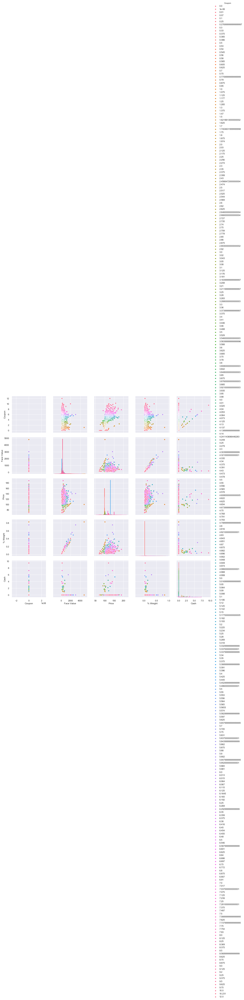

<Figure size 576x396 with 0 Axes>

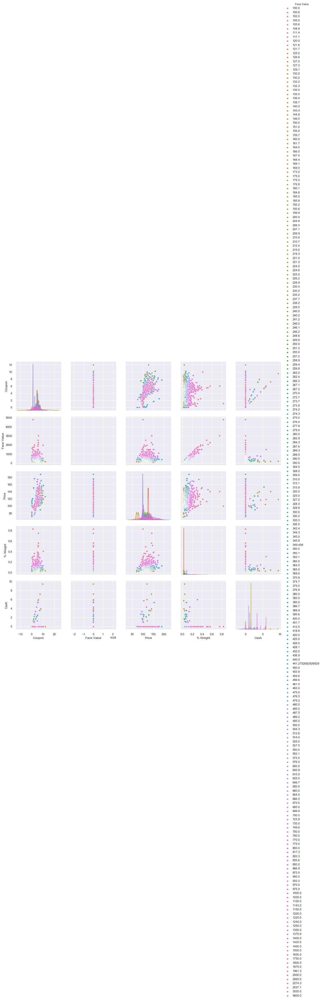

<Figure size 576x396 with 0 Axes>

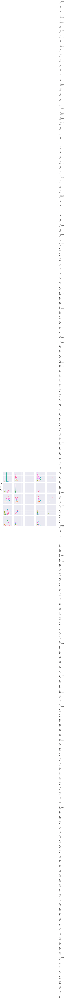

<Figure size 576x396 with 0 Axes>

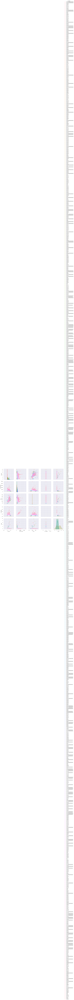

<Figure size 576x396 with 0 Axes>

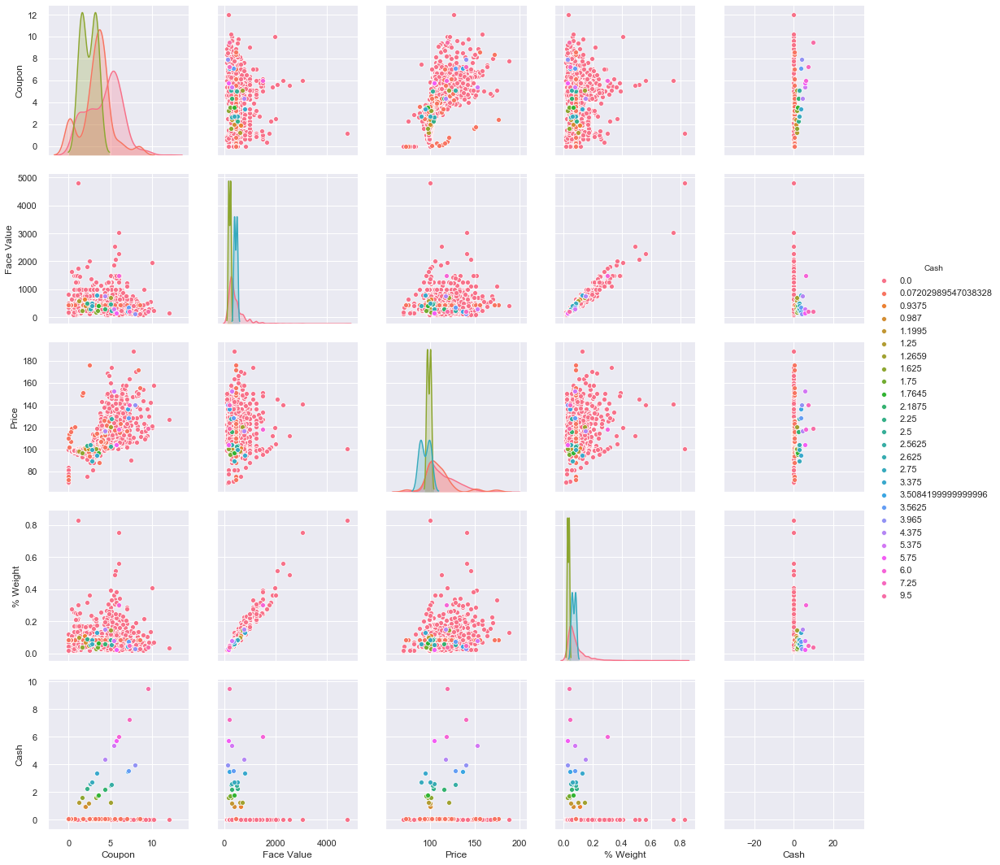

In [57]:
cat_columns = ['Coupon', 'Face Value', 'Price', '% Weight', 'Cash']
for column in cat_columns:
    sns.set()
    cols = cat_columns
    
    plt.figure()
    sns.pairplot(df_sub[cols], height=3.0, hue=column)
    plt.show()        

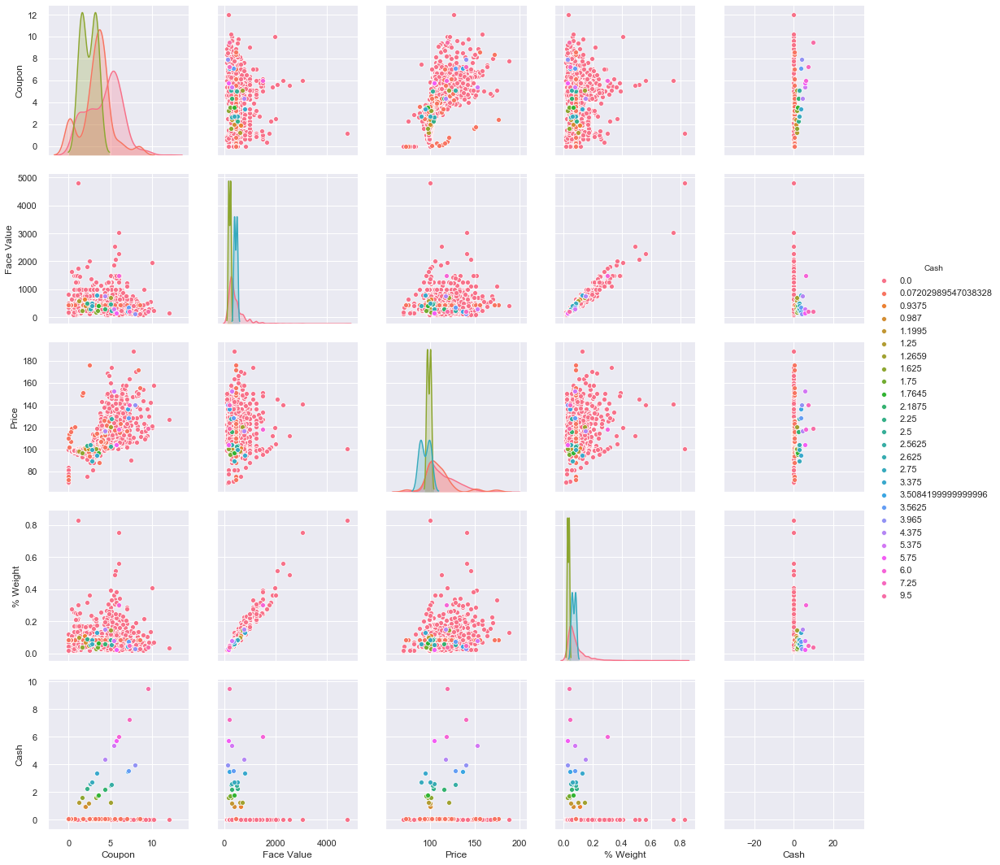

In [58]:
sns.pairplot(df_sub[cat_columns], height=3.0, hue=column)